In [1]:
from HeaderP import *

In [2]:
df = pd.read_pickle('AllztfAge_grp_cor.pkl')

In [24]:
df = df.dropna(subset=['kin_age','Prot'])
df = df.loc[df['kin_age']>0]
df = df.loc[df['Prot_log']>1].reset_index(drop=True)
len(df)

53284

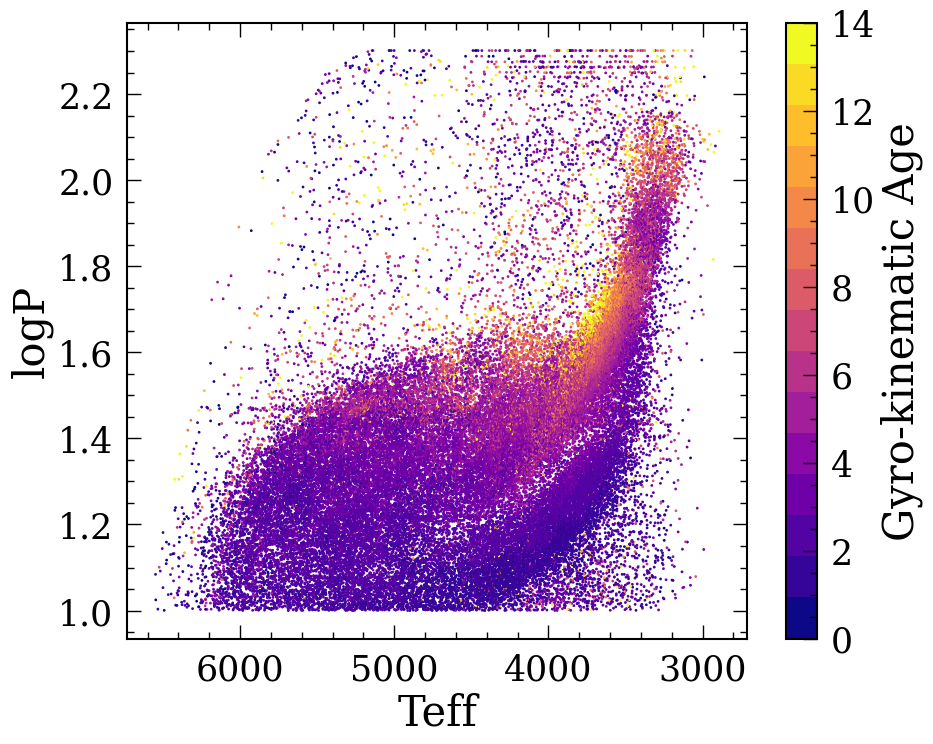

In [36]:
plt.figure(figsize=(10,8))
plt.scatter(df['teff_calc'], df['Prot_log'], c=df['kin_age'], s=1,
           cmap=plt.get_cmap('plasma',15), vmin=0, vmax=14)
plt.xlabel('Teff')
plt.ylabel('logP')
plt.gca().invert_xaxis()
plt.colorbar(label='Gyro-kinematic Age')

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_10902/3353405097.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,8))


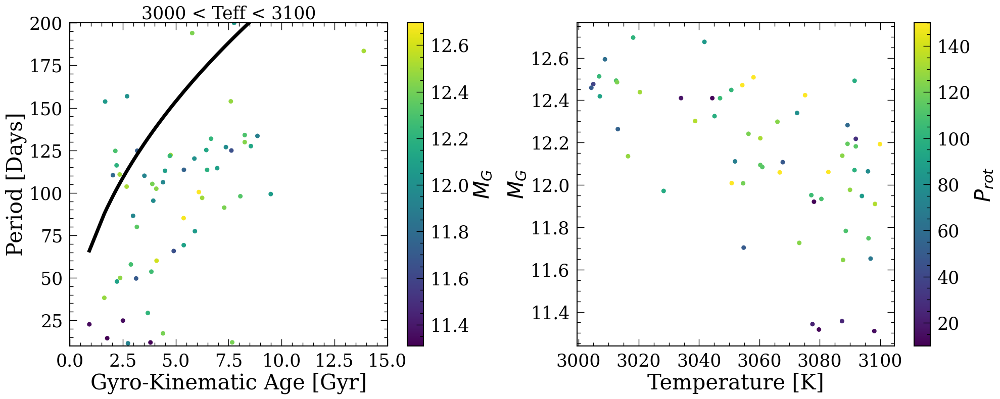

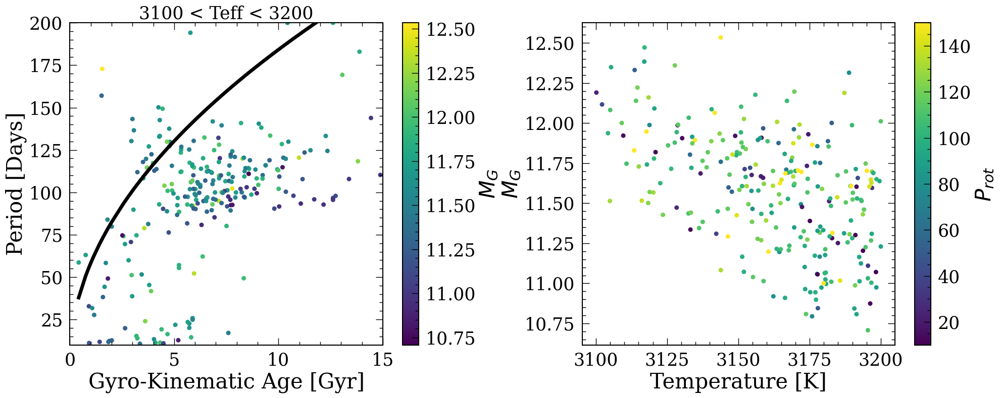

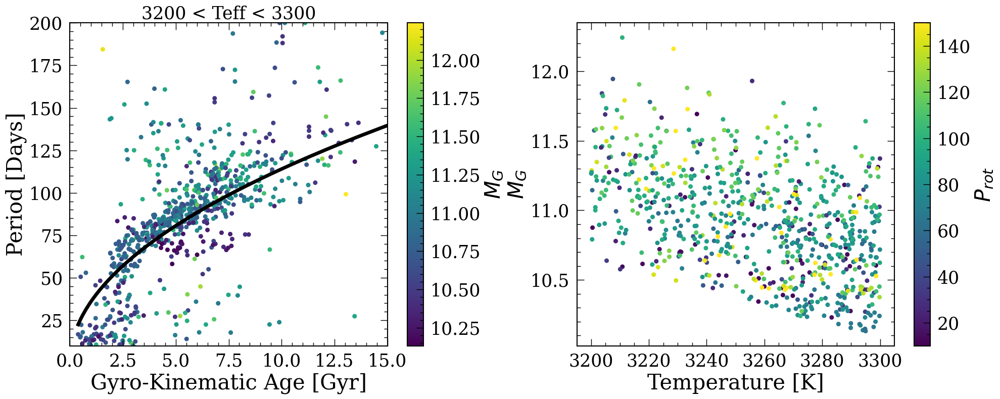

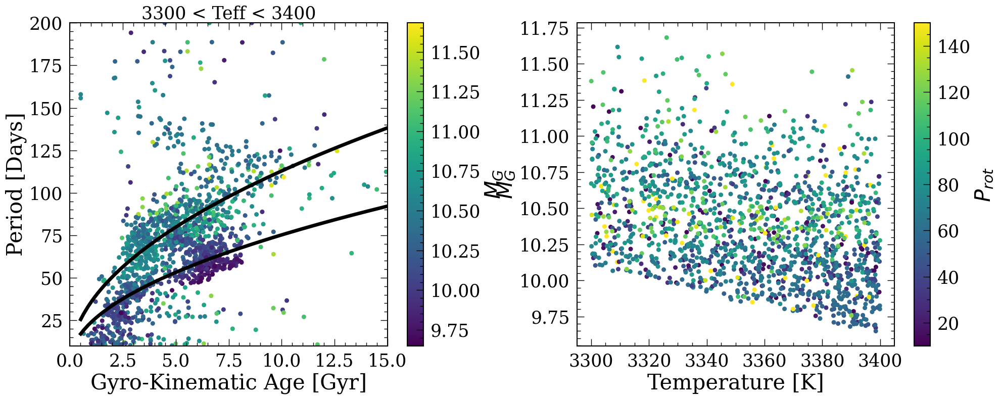

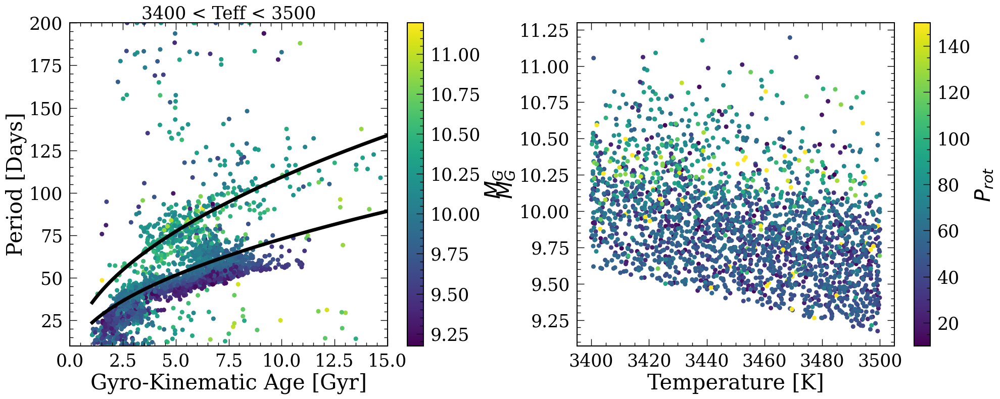

...

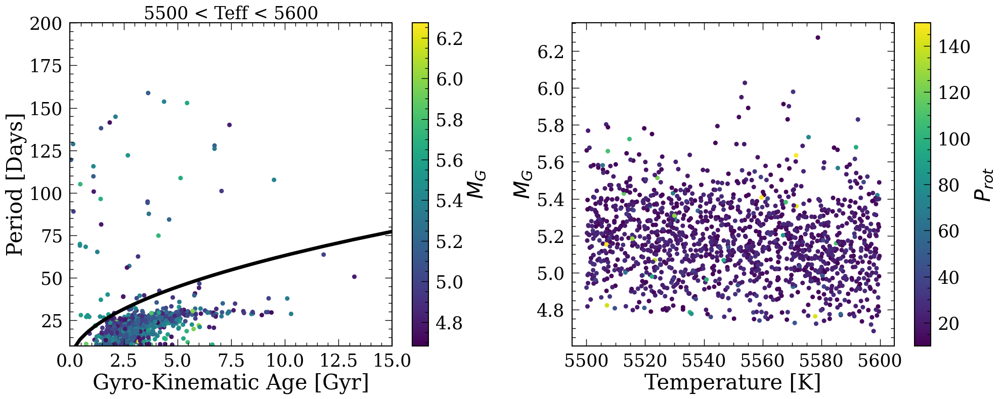

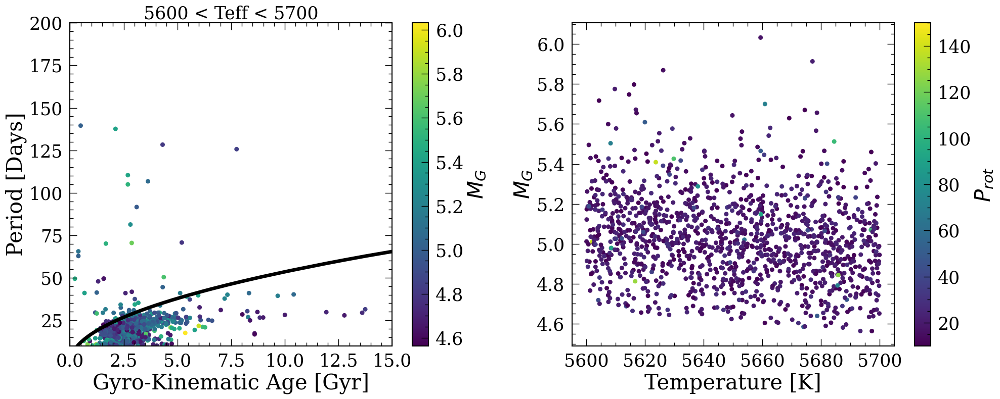

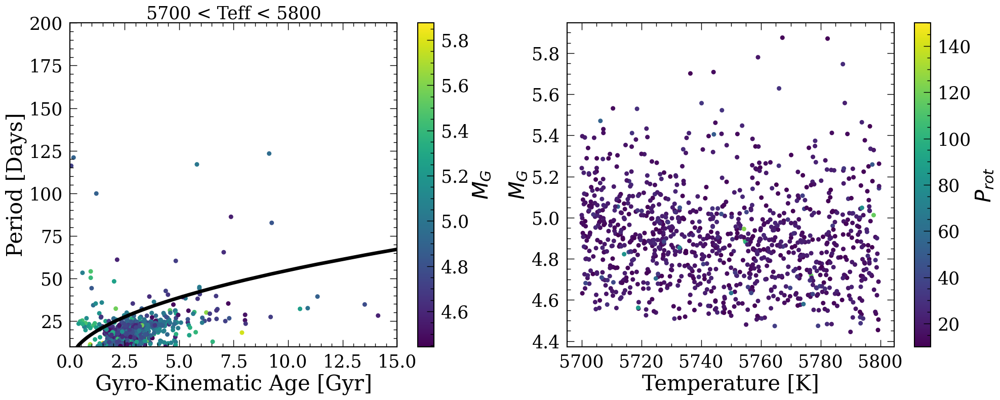

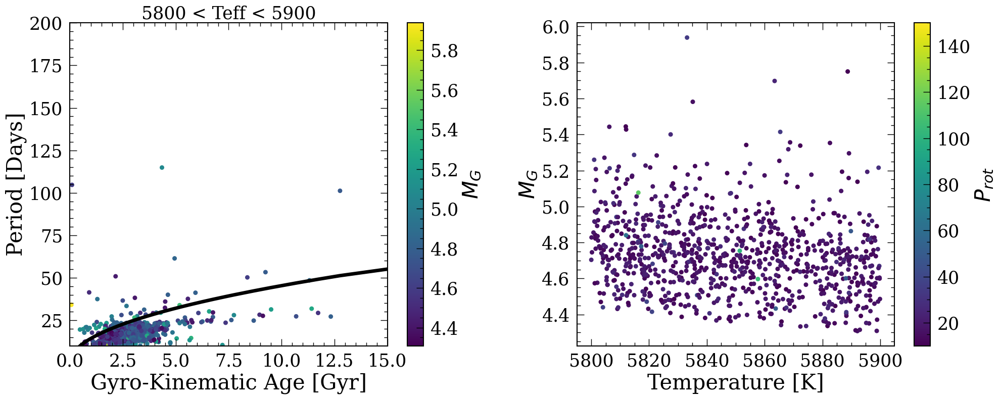

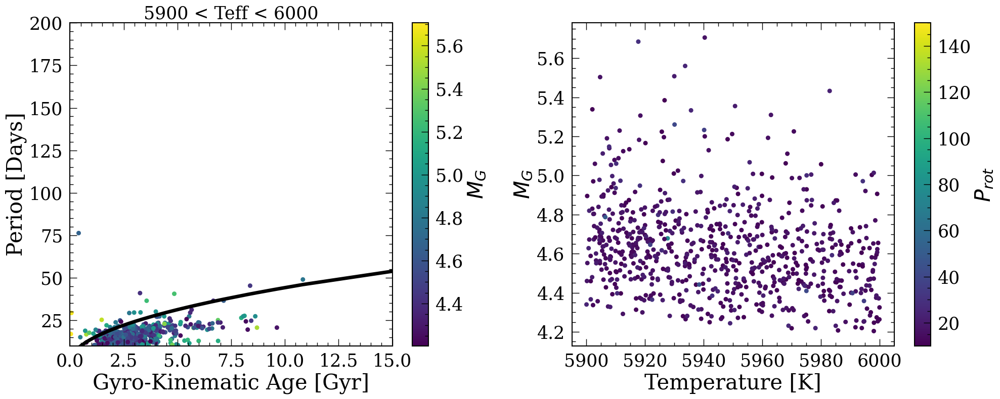

In [38]:
teffrange = np.linspace(3000, 6000, 31)
for i in range(len(teffrange)-1):
    fullyconvective = df.loc[(df['teff_calc']>teffrange[i])&(df['teff_calc']<teffrange[i+1])]
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.scatter(fullyconvective['kin_age'],fullyconvective['Prot'],
                c=fullyconvective['abs_G_dered'],s=30)
    fullyconvective = fullyconvective.sort_values('kin_age')
    meanave = np.mean(fullyconvective['Prot'][(fullyconvective['kin_age']<2)&(fullyconvective['kin_age']>1)])
    #print(meanave)
    plt.plot(fullyconvective['kin_age'], fullyconvective['kin_age']**0.5*meanave,
            'k-',linewidth=5)
    if i==4 or i==3:
        plt.plot(fullyconvective['kin_age'], fullyconvective['kin_age']**0.5*meanave*1.5,
            'k-',linewidth=5)
    plt.title('%d < Teff < %d'%(teffrange[i], teffrange[i+1]), fontsize=25)
    plt.xlim([0,15])
    plt.ylim([10,200])
    #plt.yscale('log')
    plt.xlabel('Gyro-Kinematic Age [Gyr]')
    plt.ylabel('Period [Days]')
    plt.colorbar(label='$M_G$')

    plt.subplot(1,2,2)
    plt.scatter(fullyconvective['teff_calc'],fullyconvective['abs_G_dered'],
                c=fullyconvective['Prot'],s=30, vmin=10, vmax=150)
    plt.xlabel('Temperature [K]')
    plt.ylabel('$M_G$')
    plt.colorbar(label='$P_{rot}$')
    plt.tight_layout()